<a href="https://colab.research.google.com/github/jomidokunMain/CameraCalibrations/blob/main/object_dection_box.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#clone YOLOv5 
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow 

import torch 
import os
from IPython.display import Image, clear_output # to display images
import utils
display = utils.notebook_init()  # checks


YOLOv5 🚀 v6.1-270-g6935a54 Python-3.7.13 torch-1.11.0+cu113 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.5/225.9 GB disk)


In [ ]:
from  roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook = "ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment 
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

# Get dataset from Robotflow

In [ ]:
rf = Roboflow(api_key="ynosRokZbFyzh5uzhwXf")
project = rf.workspace("cardboard-box").project("cardboard-box-hql8b")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Cardboard-Box-1 in yolov5pytorch:: 100%|██████████| 648/648 [00:00<00:00, 1091.33it/s]


# Train the model 

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Cardboard-Box-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-270-g6935a54 Python-3.7.13 torch-1.11.0+cu113 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, 

# Show Training Results 

In [ ]:
# Start tensorboard
# Launch after you have started trainig 
#  logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

# Prediction 

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source {dataset.location}/valid/images 

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Cardboard-Box-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-270-g6935a54 Python-3.7.13 torch-1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/26 /content/datasets/Cardboard-Box-1/valid/images/10-reinforced-boxes-25x18x14-cm_jpg.rf.420cc0d2a5f18808bb9b1346e873345f.jpg: 640x640 1 box, Done. (0.464s)
image 2/26 /content/datasets/Cardboard-Box-1/valid/images/2_jpg.rf.78aebe573da93bc17aa59b7025fb4051.jpg: 640x640 1 box, Done. (0.421s)
image 3/26 /content/datasets/Cardboard-Box-1/valid/images/31TLvJq3zyL_

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source /content/haffez.png

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/haffez.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-270-g6935a54 Python-3.7.13 torch-1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/1 /content/haffez.png: 416x640 1 box, Done. (0.290s)
Speed: 1.6ms pre-process, 290.0ms inference, 1.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


# Display Inference Images 

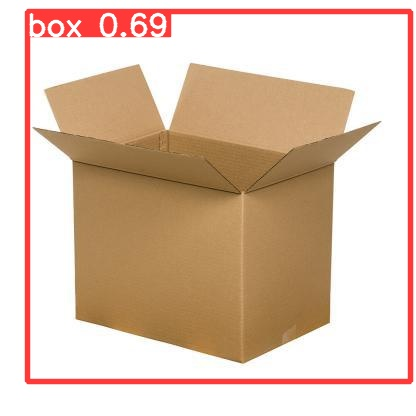

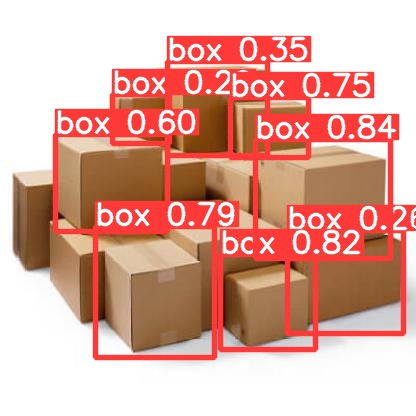

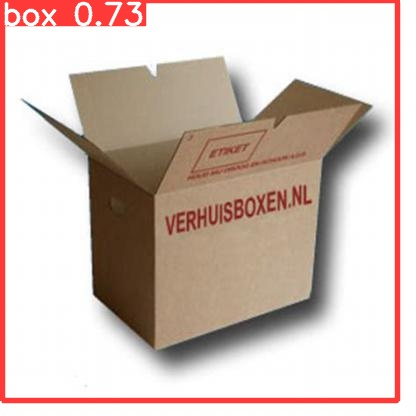

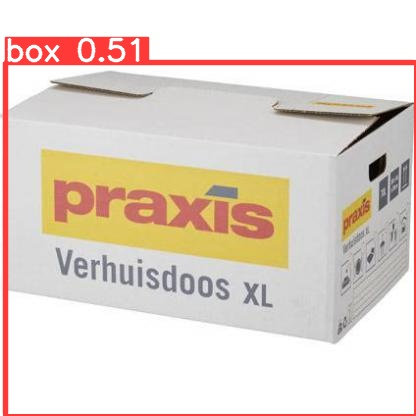

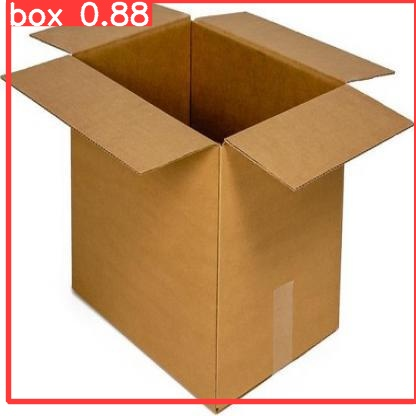

...

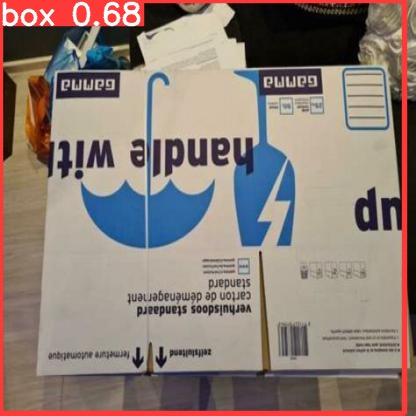

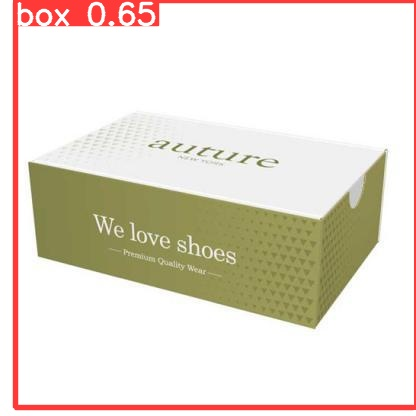

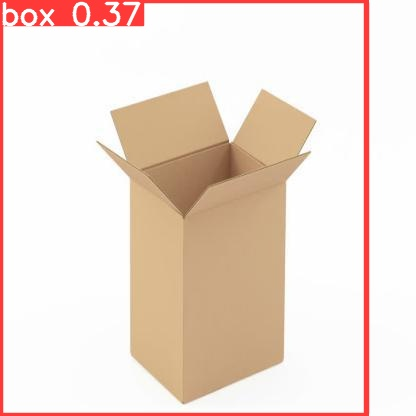

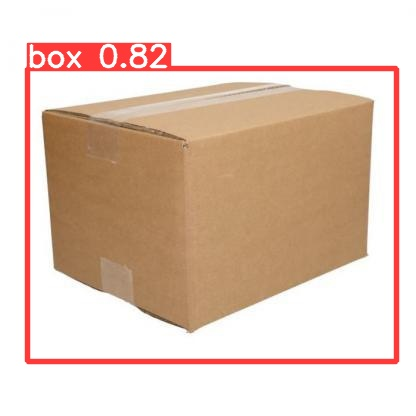

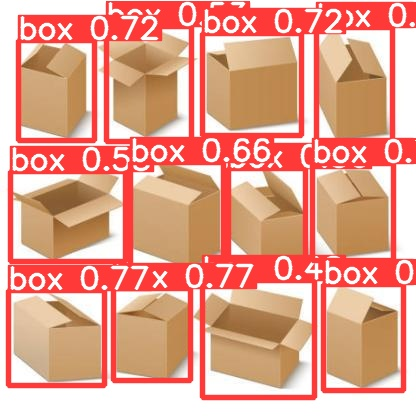

In [ ]:
#display inference on ALL test images 

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder -see prev output block 
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
  i += 1

  if i < 30:
    display(Image(filename=imageName))
    print("\n")


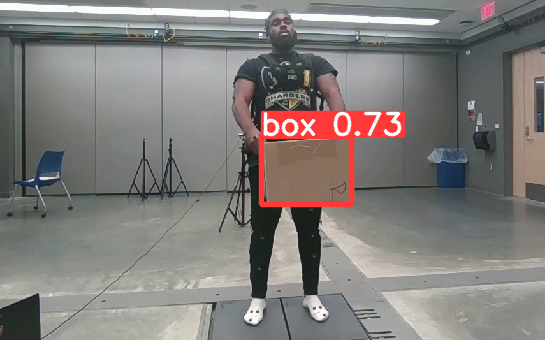

In [ ]:
j = 0
# Choose the correct exp folder -see prev output block 
for imageName2 in glob.glob('/content/yolov5/runs/detect/exp4/*.png'):
  j += 1

  if j < 30:
    display(Image(filename=imageName2))
    print("\n")
